In [39]:
# load all necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import plotly.express as px
from pandas.api.types import CategoricalDtype


pd.set_option('display.max_colwidth', 1000, 'display.max_rows', None, 'display.max_columns', None)

%matplotlib inline
import warnings
warnings.filterwarnings('ignore')


1. funded by investors vs puprose vs loan_status
2. funded_amnt vs funded_amnt_inv vs loan_amnt vs loan_status
3. inq_last_6mths vs funded_amnt vs loan_status
4. installment vs funded_amnt vs 
5. difference (loan_amnt vs funded_amnt_inv)
6. 

In [40]:
# Load loan data
lending = pd.read_csv(
    "/Users/jagadeeshmanepalli/Documents/Learnings/Upgrad/LendingClubCaseStudy/loan.csv"
)

In [41]:
# Loan data has 39717 rows and 111 features
lending.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [131]:
def display_hist_plot(data, x=None, bins=30, **kwargs):
    fig = px.histogram(data, x=x, nbins=bins)
    if kwargs:
        fig.update_layout(**kwargs)
    fig.show()

## 1. Cleaning data
1.1 check nan values count in features

In [43]:
missing_fractions = round(100 * lending.isnull().sum().sort_values(ascending=False)/len(lending.index), 2)
missing_fractions.shape

(111,)

In [44]:
missing_fractions.head()

verification_status_joint    100.0
annual_inc_joint             100.0
mo_sin_old_rev_tl_op         100.0
mo_sin_old_il_acct           100.0
bc_util                      100.0
dtype: float64

In [132]:
display_hist_plot(
    data=missing_fractions, 
    x=missing_fractions.values,
    title_text="Missing data distribution",
    xaxis_title_text="Fraction of data missing",
    yaxis_title_text="Features Count"
)

#### Summary
From above features missing fractions histogram plot, It is observed
- 50+ features data completely null values
- 50+ features have <b>non-null</b> values
- Some features have nan values 25%< nan < 75% 
</br>
<b>Therefore the feaure which has nan values more than 30% is dropped from dataframe</b>

In [46]:
filtered_cols = list(lending.columns[round(100 * lending.isna().sum()/len(lending.index), 2) < 30])

In [47]:
lending = lending[filtered_cols]
# After removing features having nan values greater than 30%, the dataframe has 53 features
lending.shape

(39717, 53)

In [48]:
lending.columns.sort_values()

Index(['acc_now_delinq', 'addr_state', 'annual_inc', 'application_type',
       'chargeoff_within_12_mths', 'collection_recovery_fee',
       'collections_12_mths_ex_med', 'delinq_2yrs', 'delinq_amnt', 'dti',
       'earliest_cr_line', 'emp_length', 'emp_title', 'funded_amnt',
       'funded_amnt_inv', 'grade', 'home_ownership', 'id',
       'initial_list_status', 'inq_last_6mths', 'installment', 'int_rate',
       'issue_d', 'last_credit_pull_d', 'last_pymnt_amnt', 'last_pymnt_d',
       'loan_amnt', 'loan_status', 'member_id', 'open_acc', 'out_prncp',
       'out_prncp_inv', 'policy_code', 'pub_rec', 'pub_rec_bankruptcies',
       'purpose', 'pymnt_plan', 'recoveries', 'revol_bal', 'revol_util',
       'sub_grade', 'tax_liens', 'term', 'title', 'total_acc', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_int', 'total_rec_late_fee',
       'total_rec_prncp', 'url', 'verification_status', 'zip_code'],
      dtype='object')

### 1.2 Imputing nan data

In [49]:
# Features to be imputed
lending.isna().sum().sort_values(ascending=False)[lending.isna().sum() > 0]

emp_title                     2459
emp_length                    1075
pub_rec_bankruptcies           697
last_pymnt_d                    71
collections_12_mths_ex_med      56
chargeoff_within_12_mths        56
revol_util                      50
tax_liens                       39
title                           11
last_credit_pull_d               2
dtype: int64

- From above nan data, the following features are considered to be imputed for further analysis.
    - chargeoff_within_12_mths
    - collections_12_mths_ex_med
    - emp_length
    - tax_liens
    - title
- The following feature is ignored:
    - last_credit_pull_d: we don't have 'last_fico_range_high' feature, hence it is not considered
    

In [50]:
lending[["chargeoff_within_12_mths", "collections_12_mths_ex_med", "tax_liens"]].value_counts()

chargeoff_within_12_mths  collections_12_mths_ex_med  tax_liens
0.0                       0.0                         0.0          39661
dtype: int64

- impute the below features with <b>mode</b>

In [51]:
lending["chargeoff_within_12_mths"].fillna(lending["chargeoff_within_12_mths"].mode()[0], inplace=True)

In [52]:
lending["collections_12_mths_ex_med"].fillna(lending["collections_12_mths_ex_med"].mode()[0], inplace=True)

In [53]:
lending["tax_liens"].fillna(lending["tax_liens"].mode()[0], inplace=True)

In [54]:
lending[["chargeoff_within_12_mths", "collections_12_mths_ex_med", "tax_liens"]].value_counts()

chargeoff_within_12_mths  collections_12_mths_ex_med  tax_liens
0.0                       0.0                         0.0          39717
dtype: int64

### 2.Univariate Analysis

In [75]:
# Checking is there any duplicate loan applicant present?
# No duplicate loan applicants, since rows count is equal to non-dupliacted count
lending["id"].duplicated(keep=False).value_counts()

False    39717
Name: id, dtype: int64

#### Summary
 - No duplicates in the data

In [76]:
zero_val_cols = [
    "acc_now_delinq", 
    "chargeoff_within_12_mths",
    "collections_12_mths_ex_med",
    "tax_liens",
]
lending[zero_val_cols].value_counts()

acc_now_delinq  chargeoff_within_12_mths  collections_12_mths_ex_med  tax_liens
0               0.0                       0.0                         0.0          39717
dtype: int64

<b>Summary</b>
- Every borrower paid(Fully Paid)/is paying(current) installment in time.
- No accounts are closed due to delinquent in last 12 months

It means, borrower likely to get loans.

#### Type Conversions
- Converting 'issue_d' feature object dtype to datetime dtype
- Converting 'year' int dtype to ordered category
- Converting 'verification_status' obj dtype to unordered category

In [203]:
# convert datetime type
lending["issue_d"] = lending["issue_d"].apply(lambda x: datetime.datetime.strptime(x, "%b-%y"))
# create a new feature column
lending["year"] = lending["issue_d"].dt.year
# convert year feature to ordered category type
cat_year = CategoricalDtype(categories=sorted(lending["year"].unique().tolist()), ordered=True)
lending["year"] = lending["year"].astype({"year": cat_year})
# convert verification_status type to categorical type
lending["verification_status"] = lending["verification_status"].astype("category")

In [91]:
lending.groupby("year").agg({"loan_amnt":["count", "mean"]})

loan_amnt              
         count          mean
year                        
2007       251   8841.733068
2008      1562   9212.724072
2009      4716   9846.548982
2010     11532  10583.610822
2011     21656  12029.302503

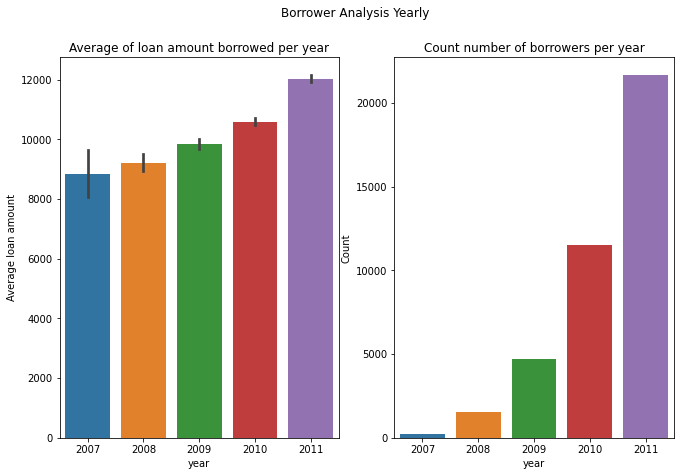

In [204]:
fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=True, figsize=(11, 7))
fig.suptitle("Borrower Analysis Yearly ")
sns.barplot(data=lending, x="year", y="loan_amnt", estimator=np.mean, ax=ax1)
sns.barplot(data=lending, x="year", y="loan_amnt", estimator=np.count_nonzero, ax=ax2)
ax1.set_title("Average of loan amount borrowed per year")
ax2.set_title("Count number of borrowers per year")
ax1.set_ylabel("Average loan amount")
ax2.set_ylabel("Count")
plt.show()

Summary:
- Average loan amount is increased per year
- Number of borrowers are increcased per year drastically, could be due to the great recession in year, 2010

In [105]:
# state wise analysis
data = lending["addr_state"].value_counts()
index = lending["addr_state"].value_counts().index
val = lending["addr_state"].value_counts().values
fig = px.scatter(
    data,
    x=index,
    y=val,
    color=val,
    size=val,
    title="State wise borrowers count",
    hover_name=index,
)
fig.update_layout(
    xaxis_title_text="State Name",
    yaxis_title_text="Borrower Count",
)
fig.show()

#### Summary
- More borrowers from metropolitian cities like California(CA), New York(NA), Florida(FL), Texas(TX). This may be due to population count is higher in metro cities.

In [106]:
lending[["total_pymnt", "total_pymnt_inv", "total_rec_prncp", "loan_amnt", "funded_amnt", "funded_amnt_inv"]].corr()

,total_pymnt,total_pymnt_inv,total_rec_prncp,loan_amnt,funded_amnt,funded_amnt_inv
total_pymnt,1.000000,0.970815,0.971472,0.886613,0.903160,0.881228
total_pymnt_inv,0.970815,1.000000,0.939581,0.854243,0.870799,0.913257
total_rec_prncp,0.971472,0.939581,1.000000,0.852021,0.870255,0.845848
loan_amnt,0.886613,0.854243,0.852021,1.000000,0.981578,0.940034
funded_amnt,0.903160,0.870799,0.870255,0.981578,1.000000,0.958422
funded_amnt_inv,0.881228,0.913257,0.845848,0.940034,0.958422,1.000000


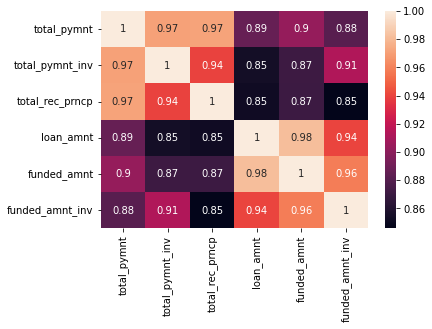

In [107]:
sns.heatmap(
    data=lending[["total_pymnt", "total_pymnt_inv", "total_rec_prncp", "loan_amnt", "funded_amnt", "funded_amnt_inv"]].corr(),
    annot=True,
)
plt.show()

#### Summary
- From correlation map, it is observed that, all features are positively correlated highly. Hence "loan_amnt" is to be considered further analysis as it is a good representation of among these features

In [205]:
# analysis on "annual_inc", From box plot, we can observe that, few borrowers have high income compartively with 50%
fig = px.box(lending, x="annual_inc")
fig.show()

- To calculate median of annual_inc, outliers are removed and consided income less than 100K dollors

In [127]:
annual_income = lending[lending["annual_inc"] <= 100000]["annual_inc"]
annual_income.mean()

54844.72395298266

In [206]:
display_hist_plot(
    annaul_income,
    bins=40,
    title="Borrowers Annual Income",
    xaxis_title_text="Annual Income"
)

#### Summary
- Most of borrowers annual income is 54,844 dollars

In [141]:
# Analysis on Employee Length
# Convert emp_length to 'ordered categorical' type
emp_cat = CategoricalDtype(
    ["< 1 year" ,"1 year", "2 years", "3 years", "5 years", "4 years", "6 years", "7 years", "8 years", "9 years", "10+ years" ]
)
lending["emp_length"] = lending["emp_length"].astype({"emp_length": emp_cat})

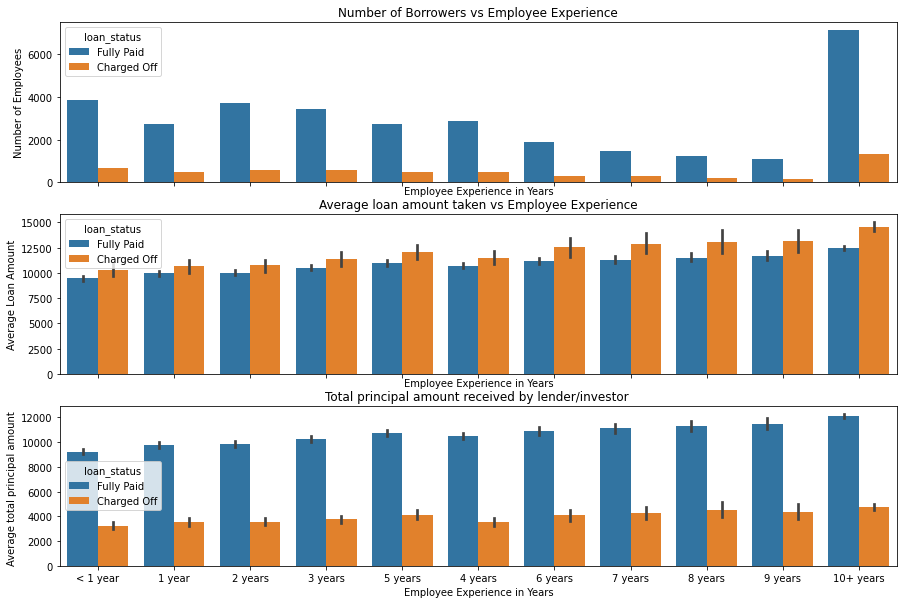

In [207]:
data = lending[lending["loan_status"] != "Current"]
fig, (ax1, ax2, ax3) = plt.subplots(3, sharex=True, figsize=(15, 10))
sns.barplot(data=data, x="emp_length", y="loan_amnt",  estimator=np.count_nonzero, hue="loan_status", ax=ax1)
sns.barplot(data=data, x="emp_length", y="loan_amnt",  estimator=np.mean, hue="loan_status", ax=ax2)
sns.barplot(data=data, x="emp_length", y="total_rec_prncp",  estimator=np.mean, hue="loan_status", ax=ax3)

ax1.set_title("Number of Borrowers vs Employee Experience")
ax1.set_xlabel("Employee Experience in Years")
ax1.set_ylabel("Number of Employees")

ax2.set_title("Average loan amount taken vs Employee Experience")
ax2.set_xlabel("Employee Experience in Years")
ax2.set_ylabel("Average Loan Amount")

ax3.set_title("Total principal amount received by lender/investor ")
ax3.set_xlabel("Employee Experience in Years")
ax3.set_ylabel("Average total principal amount ")
plt.show()

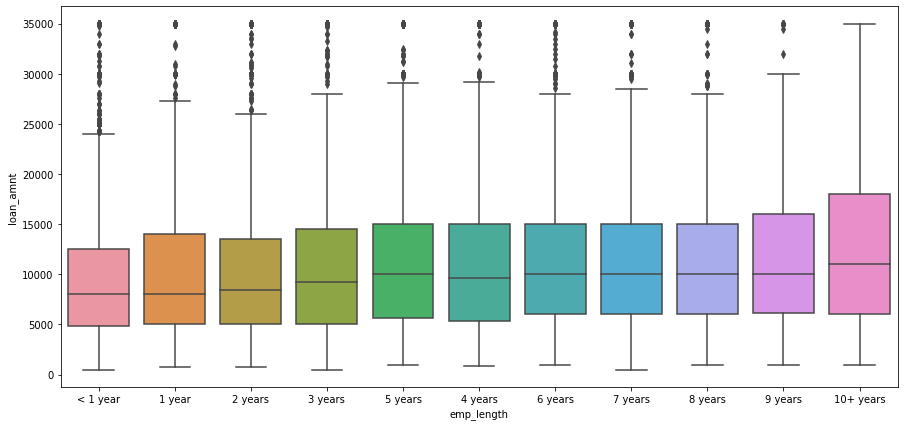

In [216]:
fig, ax1 = plt.subplots(1, sharex=True, figsize=(15, 7))
sns.boxplot(data=data, x="emp_length", y="loan_amnt", ax=ax1)
plt.show()

#### Summary
- It is obeserved that, 
    - more defaulters from 10+ years, intersetingly, mid level senior employees are less defualters compartively low experience and 10+ years experience.
    - Lenders are collecting loan amount almost double of princpal amount from the borrower, hence investors have a high profit over the years.


In [188]:
# Analysis on purpose
# Convert obj type to unordered categorical type
data["purpose"] = data["purpose"].astype("category")
purpose_data = data["purpose"].unique().tolist()
data["purpose"].value_counts().sort_values(ascending=False)

debt_consolidation    18055
credit_card            5027
other                  3865
home_improvement       2875
major_purchase         2150
small_business         1754
car                    1499
wedding                 926
medical                 681
moving                  576
vacation                375
house                   367
educational             325
renewable_energy        102
Name: purpose, dtype: int64

In [181]:
list(range(len(purpose_data)))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]

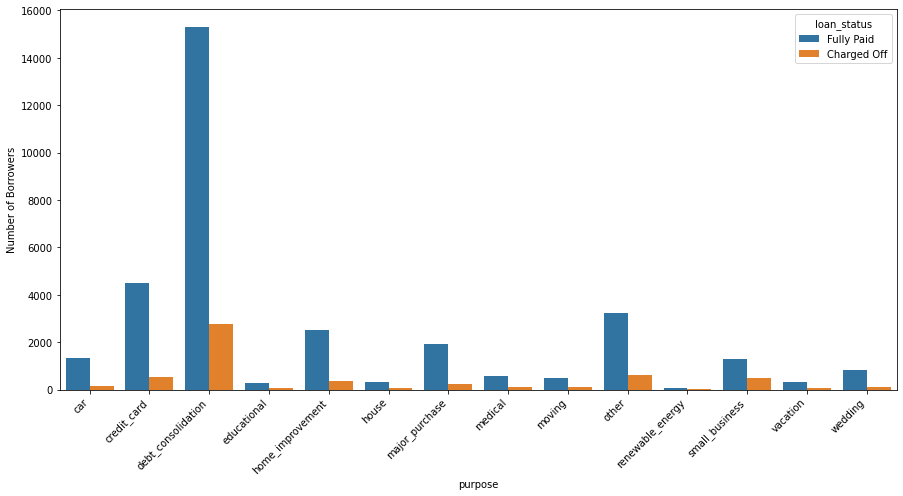

In [201]:
fig, ax1 = plt.subplots(1, sharex=True, figsize=(15, 7))
sns.barplot(data=data, x="purpose", y="loan_amnt",  estimator=np.count_nonzero, hue="loan_status", ax=ax1)
plt.xticks(ticks=list(range(len(purpose_data))),labels=None,  rotation=45, ha='right')
ax1.set_ylabel("Number of Borrowers")
plt.show()

#### Summary
- More borrowers are from debt consolidation and credit cards and these are high defaulters as well
- Comparitively, small_bussiness are more defaulters

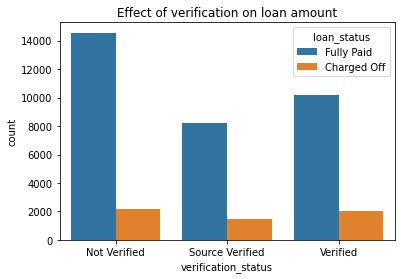

In [237]:
sns.barplot(data=data,
            x="verification_status",
            y="loan_amnt",
            estimator=np.count_nonzero,
            hue="loan_status",
        )
plt.title("Effect of verification on loan amount")
plt.ylabel("count")
plt.show()

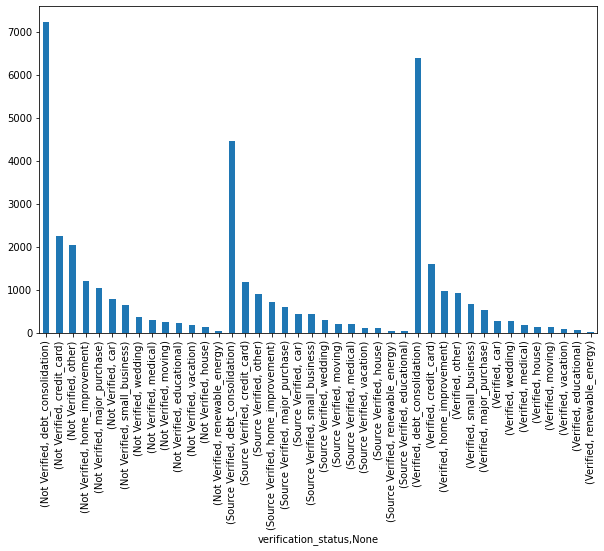

In [231]:
data.groupby(by=["verification_status"])["purpose"].value_counts().plot(kind='bar', stacked=False, figsize=[10,6])
plt.show()

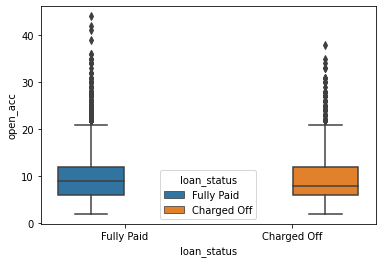

In [311]:
sns.boxplot(data=lending, x="loan_status", y="open_acc", hue="loan_status")
plt.show()

In [233]:
fig = px.histogram(lending, x="open_acc", nbins=20)
fig.show()

In [235]:
fig = px.box(data, x="loan_status", y="open_acc", color="loan_status")
fig.show()

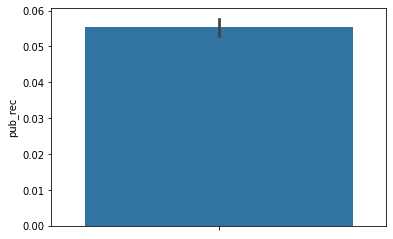

In [333]:
sns.barplot(data=lending, y="pub_rec")
plt.show()

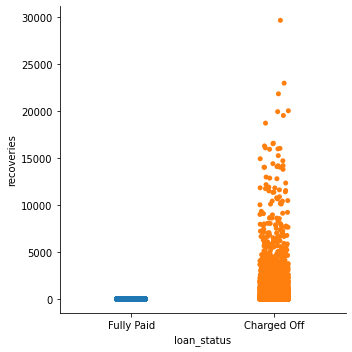

In [362]:
sns.catplot(data=lending, x="loan_status", y="recoveries")
plt.show()

#### Summary
The borrower more like to become as a defualter, if borrower has a high recoveries

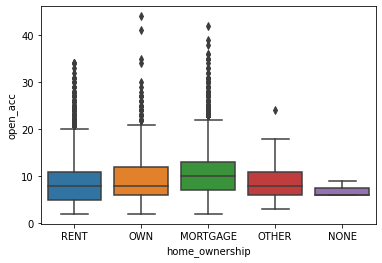

In [240]:
sns.boxplot(data=data, x="home_ownership", y="open_acc")
plt.show()

### Summary
- people with mortgage have more open_acc

In [246]:
display_hist_plot(data, x="int_rate", bins=20)